# Fall Detection
using TensorFlow 2 Object Detection API

---
## Environment Setup

### Install required libraries



In [1]:
%tensorflow_version

!pip install -q pillow lxml jupyter matplotlib cython pandas contextlib2
!apt-get install -qq protobuf-compiler
!pip install -q pycocotools tf_slim

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.2/121.2 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.0 MB/s eta 0:00:00


### Set configurations

In [2]:
import os

# Repo URL
repo_url = 'https://github.com/yxong1114/fall-detection'

# Models
MODELS_CONFIG = {
    'ssd_mobilenet_v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'model_path': '/models/my_ssd_mobilenet_v2/',
        'pipeline_file': 'pipeline.config'
    },
    'ssd_mobilenet_v2_fpn': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'model_path': '/models/tf2/my_ssd_mobilenet_v2_fpnlite/',
        'pipeline_file': 'pipeline.config'
    },
    'my_centernet_resnet50_v1_fpn': {
        'model_name': 'centernet_resnet50_v1_fpn_512x512_coco17_tpu-8',
        'model_path': '/models/tf2/my_centernet_resnet50_v1_fpn/',
        'pipeline_file': 'pipeline.config'
    },
    'my_centernet_resnet101_v1_fpn': {
        'model_name': 'centernet_resnet101_v1_fpn_512x512_coco17_tpu-8',
        'model_path': '/models/tf2/my_centernet_resnet101_v1_fpn/',
        'pipeline_file': 'pipeline.config'
    },
    'efficient_det_d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'model_path': '/models/efficientdet_d0/',
        'pipeline_file': 'pipeline.config'
    }
}

# Select a model to use.
selected_model = 'ssd_mobilenet_v2'

model_name = MODELS_CONFIG[selected_model]['model_name']
model_path = MODELS_CONFIG[selected_model]['model_path']
pipeline_file = MODELS_CONFIG[selected_model]['pipeline_file']

# Set Repository Home Directory
repo_dir_path = os.path.abspath(os.path.join('.', os.path.basename(repo_url)))

# Set Label Map (.pbtxt) path and pipeline.config path
label_map_pbtxt_fname = repo_dir_path + '/annotations/label_map.pbtxt'
pipeline_fname = repo_dir_path + model_path + pipeline_file

# Set .record path
test_record_fname = repo_dir_path + '/annotations/test.record'
train_record_fname = repo_dir_path + '/annotations/train.record'

# Set output directories and clean up
model_dir = repo_dir_path + '/training/'
output_dir = repo_dir_path + '/exported-models/'

!rm -rf {model_dir} {output_dir}
os.makedirs(model_dir, exist_ok=True)
os.makedirs(output_dir, exist_ok=True)

### Clone TensorFlow models

In [3]:
# Clone Tensorflow model repo
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git
# Compile protocol buffers
%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
# Set environment variables
import os
os.environ['PYTHONPATH'] += ':/content/models:/content/models/research/:/content/models/research/slim/'
# Install libraries
!pip install .
# Test
!python object_detection/builders/model_builder_test.py

/content
/content/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 65.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.6/240.6 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 630.1/630.1 kB 51.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 106.4 M

2023-04-26 16:44:00.733401: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-26 16:44:01.637869: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### COCO API Installation 

In [4]:
# Coco Installation (Optional, required when using Coco Evaluation)
%cd /content
!git clone --quiet https://github.com/cocodataset/cocoapi.git
%cd cocoapi/PythonAPI
!make
!cp -r pycocotools /content/models/research/

/content
/content/cocoapi/PythonAPI
python setup.py build_ext --inplace
running build_ext
cythoning pycocotools/_mask.pyx to pycocotools/_mask.c
/usr/local/lib/python3.9/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/cocoapi/PythonAPI/pycocotools/_mask.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'pycocotools._mask' extension
creating build
creating build/common
creating build/temp.linux-x86_64-3.9
creating build/temp.linux-x86_64-3.9/pycocotools
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/local/lib/python3.9/dist-packages/numpy/core/include -I../common -I/usr/include/python3.9 -c ../common/maskApi.c -o build/te

### Download Pretrained Model

In [5]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
MODEL_FILE = model_name + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(model_name, DEST_DIR)

# Check downloaded files
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

# Set fine tune checkpoint
fine_tune_checkpoint = os.path.join(DEST_DIR, "checkpoint/ckpt-0")
print("fine_tune_checkpoint: ", fine_tune_checkpoint)

/content/models/research
/content/models/research/pretrained_model
total 24K
drwxr-x---  4 345018 89939 4.0K Jul 11  2020 .
drwxr-xr-x 26 root   root  4.0K Apr 26 16:44 ..
drwxr-x---  2 345018 89939 4.0K Jul 10  2020 checkpoint
-rw-r-----  1 345018 89939 4.4K Jul 11  2020 pipeline.config
drwxr-x---  3 345018 89939 4.0K Jul 10  2020 saved_model
fine_tune_checkpoint:  /content/models/research/pretrained_model/checkpoint/ckpt-0


### Clone Project Repository

In [6]:
import os
%cd /content
# Clean up
!rm -rf {repo_dir_path}

# Clone
!git clone {repo_url}

# Pull (just in case the repo already exists)
%cd {repo_dir_path}
!git pull

# Check if label map and pipeline files exist
assert os.path.isfile(label_map_pbtxt_fname), '`{}` not exist'.format(label_map_pbtxt_fname)
assert os.path.isfile(pipeline_fname), '`{}` not exist'.format(pipeline_fname)

/content
Cloning into 'fall-detection'...
remote: Enumerating objects: 2659, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 2659 (delta 1), reused 0 (delta 0), pack-reused 2656
Receiving objects: 100% (2659/2659), 2.39 GiB | 34.81 MiB/s, done.
Resolving deltas: 100% (821/821), done.
Updating files: 100% (2849/2849), done.
/content/fall-detection
Already up to date.


In [7]:
# Check pipeline config - update if required
!cat {pipeline_fname}

model {
  ssd {
    num_classes: 3
    image_resizer {
      fixed_shape_resizer {
        height: 300
        width: 300
      }
    }
    feature_extractor {
      type: "ssd_mobilenet_v2_keras"
      depth_multiplier: 1.0
      min_depth: 16
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 3.9999998989515007e-05
          }
        }
        initializer {
          truncated_normal_initializer {
            mean: 0.0
            stddev: 0.029999999329447746
          }
        }
        activation: RELU_6
        batch_norm {
          decay: 0.9700000286102295
          center: true
          scale: true
          epsilon: 0.0010000000474974513
          train: true
        }
      }
      override_base_feature_extractor_hyperparams: true
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
    

## Preprocess Images

### Convert .xml files to csv

In [8]:
# Create train data:
!python scripts/xml_to_csv.py -i images_v2/train -o annotations/train_labels.csv

# Create test data:
!python scripts/xml_to_csv.py -i images_v2/test -o annotations/test_labels.csv

Successfully converted xml to csv.
Successfully converted xml to csv.


### Convert to TFRecord format (.record)

In [9]:
# Create train data:
!python scripts/generate_tfrecord.py -c annotations/train_labels.csv -i images_v2/train -x images_v2/train -o annotations/train.record -l annotations/label_map.pbtxt

# Create test data:
!python scripts/generate_tfrecord.py -c annotations/test_labels.csv -i images_v2/test -x images_v2/test -o annotations/test.record -l annotations/label_map.pbtxt

# Check
assert os.path.isfile(test_record_fname), '`{}` not exist'.format(test_record_fname)
assert os.path.isfile(train_record_fname), '`{}` not exist'.format(train_record_fname)

Successfully created the TFRecord file: annotations/train.record
Successfully created the CSV file: annotations/train_labels.csv
Successfully created the TFRecord file: annotations/test.record
Successfully created the CSV file: annotations/test_labels.csv


## Training

### Tensorboard

In [10]:
# Set log directory for tensorboard to watch
LOG_DIR = model_dir

# Clean up the directory
!rm -rf {LOG_DIR}/*

In [11]:
# Use magic command to launch tensorboard within the notebook
%load_ext tensorboard
%tensorboard --logdir {LOG_DIR}

<IPython.core.display.Javascript object>

In [ ]:
%reload_ext tensorboard

## Train

In [12]:
# Make sure to have the latest project repo downloaded
%cd {repo_dir_path}
!git pull

/content/fall-detection
Already up to date.


In [13]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --alsologtostderr

/content/fall-detection
2023-04-26 16:49:23.813981: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-26 16:49:24.773533: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-04-26 16:49:27.642905: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-04-26 16:49:27.678973: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA n

In [14]:
# Check the generated files
!ls -lrt {model_dir}

total 201328
drwxr-xr-x 2 root root     4096 Apr 26 16:49 train
-rw-r--r-- 1 root root 18796194 Apr 26 16:50 ckpt-1.data-00000-of-00001
-rw-r--r-- 1 root root    22266 Apr 26 16:50 ckpt-1.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:01 ckpt-2.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:01 ckpt-2.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:10 ckpt-3.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:10 ckpt-3.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:19 ckpt-4.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:19 ckpt-4.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:28 ckpt-5.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:28 ckpt-5.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:37 ckpt-6.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:37 ckpt-6.index
-rw-r--r-- 1 root root      610 Apr 26 17:37 checkpoint


### Evaluation

In [15]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_fname} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \
    --eval_timeout=60

/content/fall-detection
2023-04-26 17:38:25.424734: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-26 17:38:27.419397: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-04-26 17:38:32.958788: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-04-26 17:38:33.067183: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA n

In [16]:
# Check the generated files
!ls -lrt {model_dir}

total 201332
drwxr-xr-x 2 root root     4096 Apr 26 16:49 train
-rw-r--r-- 1 root root 18796194 Apr 26 16:50 ckpt-1.data-00000-of-00001
-rw-r--r-- 1 root root    22266 Apr 26 16:50 ckpt-1.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:01 ckpt-2.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:01 ckpt-2.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:10 ckpt-3.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:10 ckpt-3.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:19 ckpt-4.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:19 ckpt-4.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:28 ckpt-5.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:28 ckpt-5.index
-rw-r--r-- 1 root root 37420235 Apr 26 17:37 ckpt-6.data-00000-of-00001
-rw-r--r-- 1 root root    41646 Apr 26 17:37 ckpt-6.index
-rw-r--r-- 1 root root      610 Apr 26 17:37 checkpoint
drwxr-xr-x 2 root root     4096 Apr 26 17:38 eval


## Export the output model

In [17]:
%cd {repo_dir_path}
!python /content/models/research/object_detection/exporter_main_v2.py \
    --input_type image_tensor \
    --pipeline_config_path {pipeline_fname} \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_dir}

/content/fall-detection
2023-04-26 17:40:04.086851: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-26 17:40:05.036424: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-04-26 17:40:07.316206: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-04-26 17:40:07.350799: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA n

In [18]:
# Check the output files
!echo {output_dir}
!ls -lsr {output_dir}

/content/fall-detection/exported-models/
total 16
4 drwxr-xr-x 4 root root 4096 Apr 26 17:40 saved_model
8 -rw-r--r-- 1 root root 4284 Apr 26 17:40 pipeline.config
4 drwxr-xr-x 2 root root 4096 Apr 26 17:40 checkpoint


### Archive the output directory

In [19]:
%cd {repo_dir_path}
!tar zcvf trained_model.tar.gz {output_dir}

/content/fall-detection
tar: Removing leading `/' from member names
/content/fall-detection/exported-models/
/content/fall-detection/exported-models/checkpoint/
/content/fall-detection/exported-models/checkpoint/checkpoint
/content/fall-detection/exported-models/checkpoint/ckpt-0.data-00000-of-00001
/content/fall-detection/exported-models/checkpoint/ckpt-0.index
/content/fall-detection/exported-models/saved_model/
/content/fall-detection/exported-models/saved_model/variables/
/content/fall-detection/exported-models/saved_model/variables/variables.data-00000-of-00001
/content/fall-detection/exported-models/saved_model/variables/variables.index
/content/fall-detection/exported-models/saved_model/assets/
/content/fall-detection/exported-models/saved_model/saved_model.pb
/content/fall-detection/exported-models/saved_model/fingerprint.pb
/content/fall-detection/exported-models/pipeline.config


### Download the archive

In [20]:
from google.colab import files
files.download('trained_model.tar.gz')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---
## Prediction using trained model

### Set images for the inference

In [ ]:
import os

# Use images in test dir (update this if you have other images for inference)
IMAGE_DIR = os.path.join(repo_dir_path, "images", "test")
IMAGE_PATHS = []

for file in os.listdir(IMAGE_DIR):
    if file.endswith(".jpg") or file.endswith(".png"):
        IMAGE_PATHS.append(os.path.join(IMAGE_DIR, file))

IMAGE_PATHS

NameError: ignored

### Load the trained model

In [ ]:
%cd /content

import time
import tensorflow as tf # Added as colab instance often crash
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

# Label Map path
PATH_TO_LABELS = label_map_pbtxt_fname
# Saved model path
PATH_TO_SAVED_MODEL = os.path.join(output_dir, "saved_model")

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# Set category index
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

/content
Loading model...Done! Took 13.231811285018921 seconds


### Make prediction

Running inference for /content/fall-detection/images/test/fall (21).png... Done
Running inference for /content/fall-detection/images/test/sit (39).png... Done
Running inference for /content/fall-detection/images/test/walk (10).png... Done
Running inference for /content/fall-detection/images/test/walk (30).png... Done
Running inference for /content/fall-detection/images/test/walk (45).png... Done
Running inference for /content/fall-detection/images/test/fall (15).png... Done
Running inference for /content/fall-detection/images/test/fall (1).png... Done
Running inference for /content/fall-detection/images/test/fall (2).png... Done
Running inference for /content/fall-detection/images/test/sit (28).png... Done
Running inference for /content/fall-detection/images/test/walk (2).png... Done
Running inference for /content/fall-detection/images/test/fall (45).png... Done
Running inference for /content/fall-detection/images/test/walk (23).png... Done
Running inference for /content/fall-detection

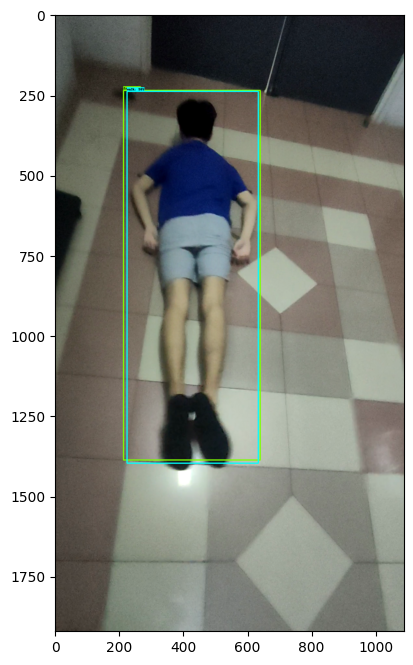

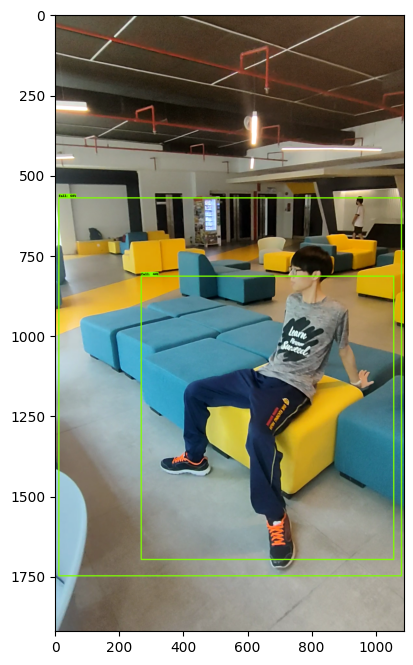

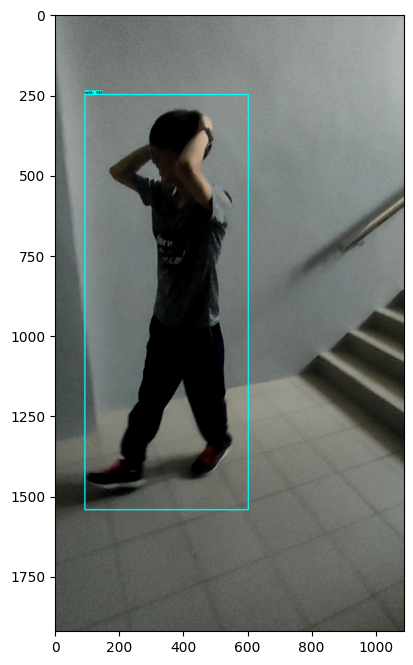

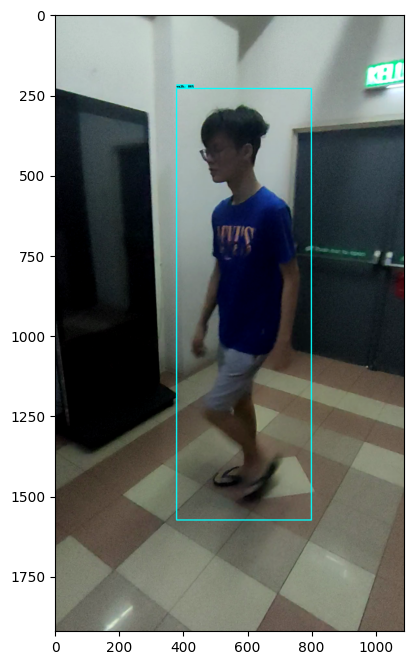

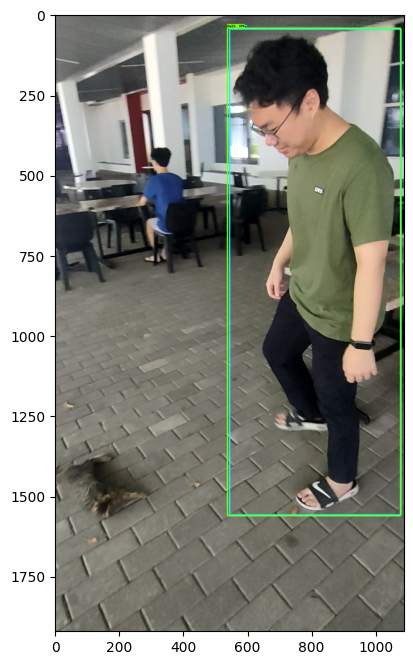

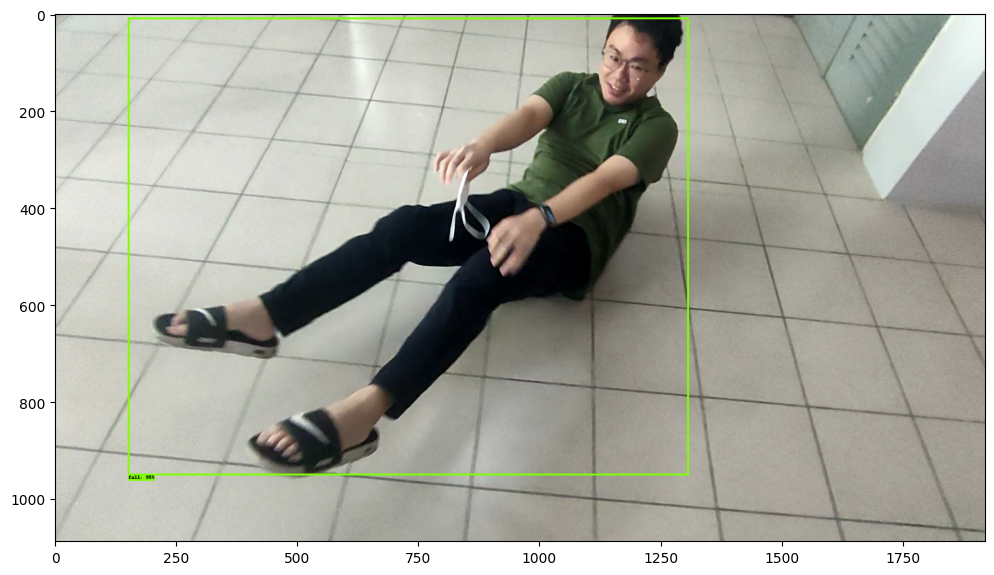

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
# This is required to display the images.
%matplotlib inline 

for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    # Puts image into numpy array to feed into tensorflow graph.
    # Note that by convention we put it into a numpy array with shape
    #   (height, width, channels), where channels=3 for RGB.
    image_np = np.array(Image.open(image_path))

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)

    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=20,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure(figsize = (12,8))
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()